<figure>
  <IMG src="figures/logo-esi-sba.png" WIDTH=300 height="100" ALIGN="right">
</figure>

# Practical Trainining Series on Software Engineering For Data Science  
*By Dr. Belkacem KHALDI (b.khaldi@esi-sba.dz)*

# Notebook 7: Data Processing & Cleaning for Data Science: Exploratory Data Analysis and Visualization– Going Deeper
The purpose of this [Jupyter Notebook] is to getting you go deeper on Data Processing & Cleaning for Data
Science. It provides a set of practical Training challenges that allow grasping the different concepts presented in  lecture 7.

## EDA

### Challenge 1:  iTunes dataset
Using the iTunes dataset existed in the /data folder of this notebook, you are asked to  proceed with the  exploratory data analysis and visulaization techniques seen in lecture 7 to provide a clean dataset as well as to report a small summary of your EDA results to your team.

The EDA should be done using a visualization technique rather than using the basic EDA procedures seen in Lecture 5.
See Test from Slide 4 to 16.

Report the possible high correlation found from your visualization EDA.


High Correlations (Threshold >= 0.7):
 UnitPrice  Minutes      0.931796
           MB           0.938482
Minutes    UnitPrice    0.931796
           MB           0.960181
MB         UnitPrice    0.938482
           Minutes      0.960181
dtype: float64


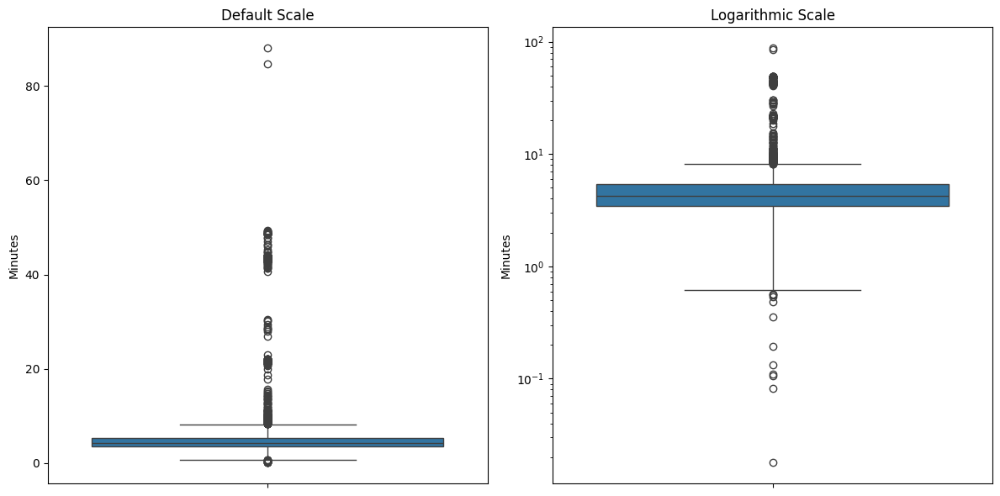

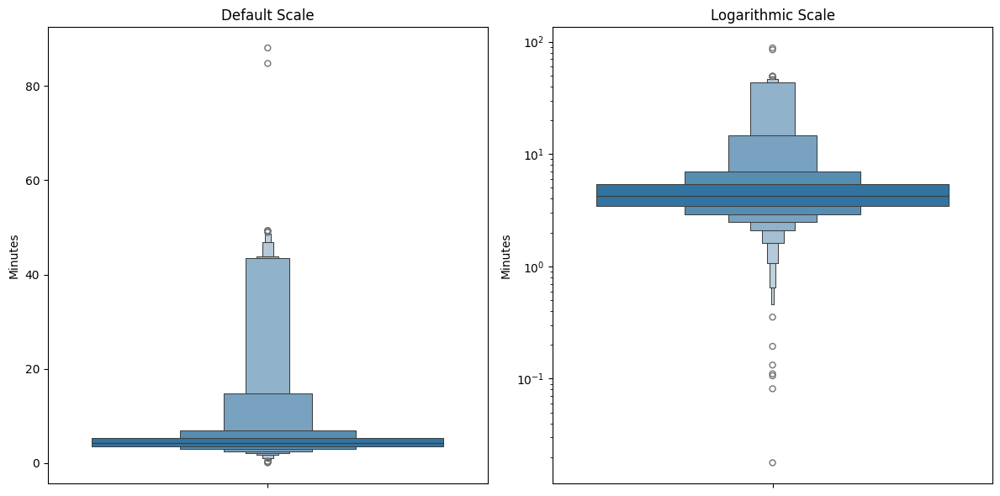

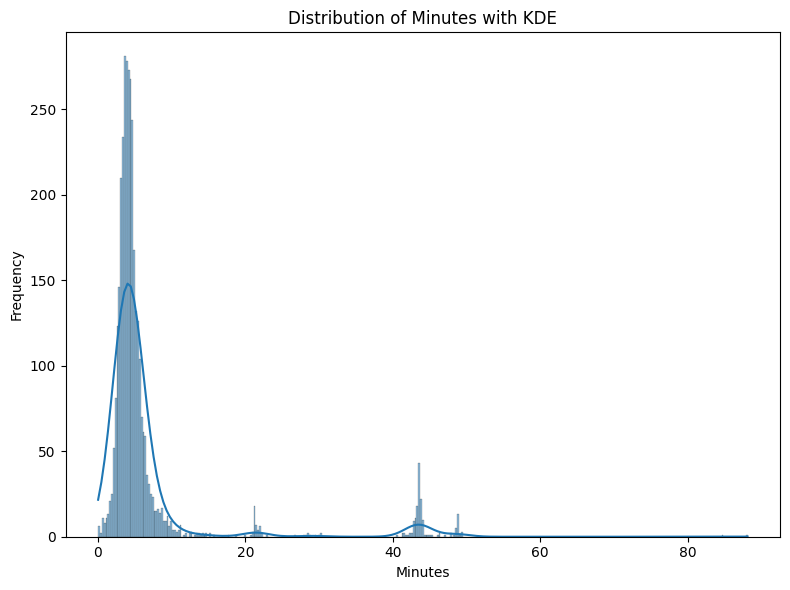

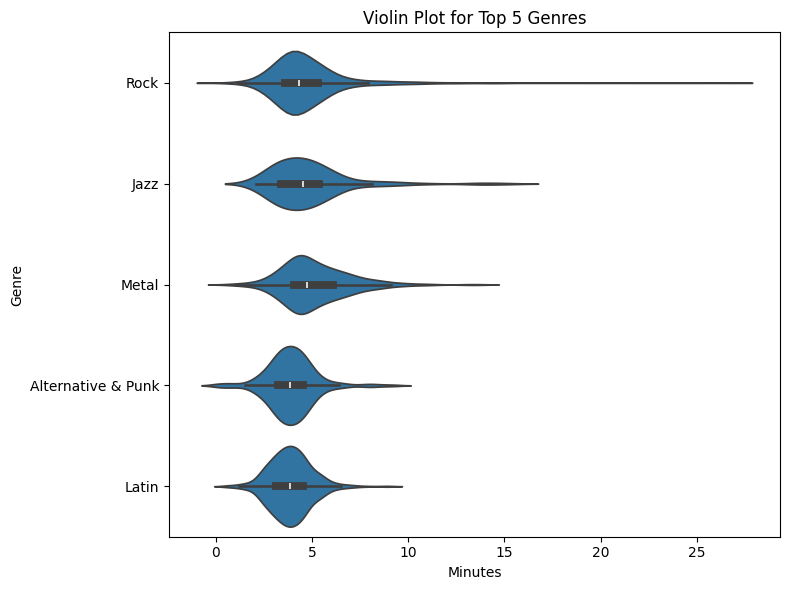

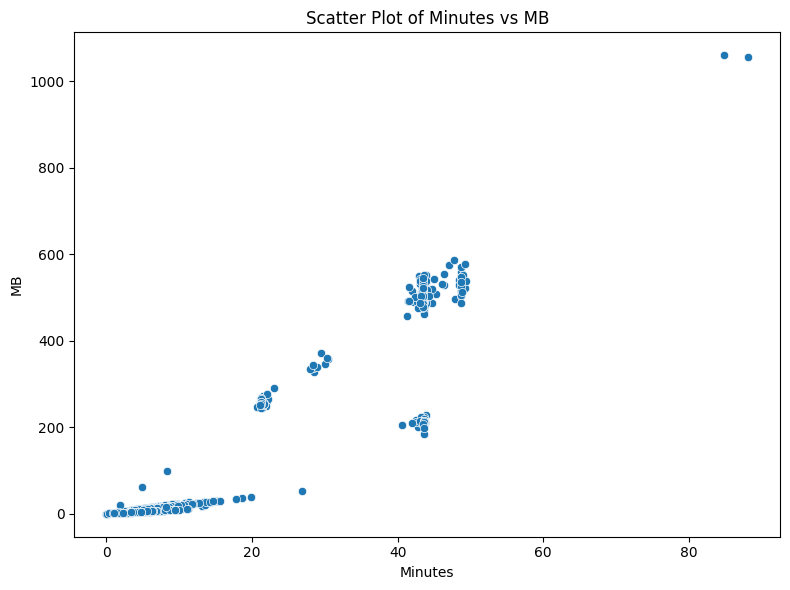

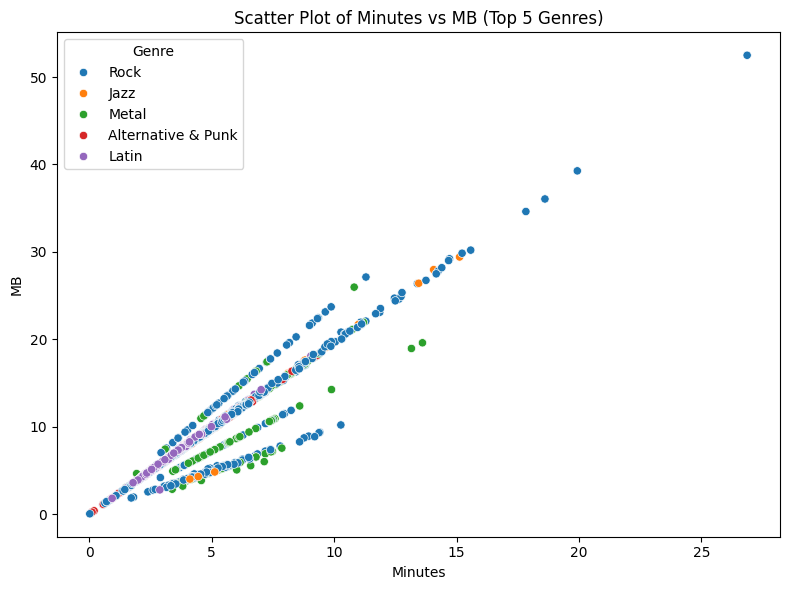

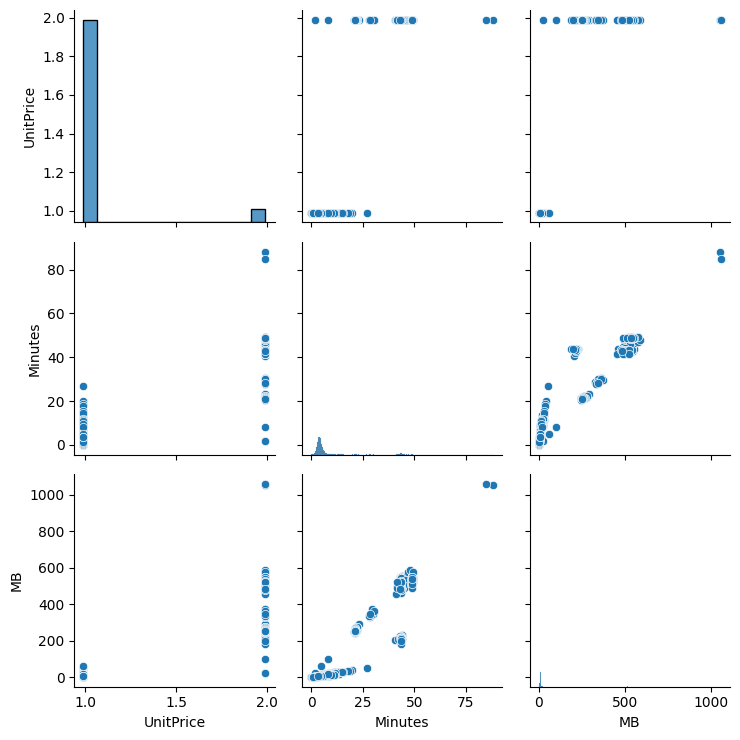

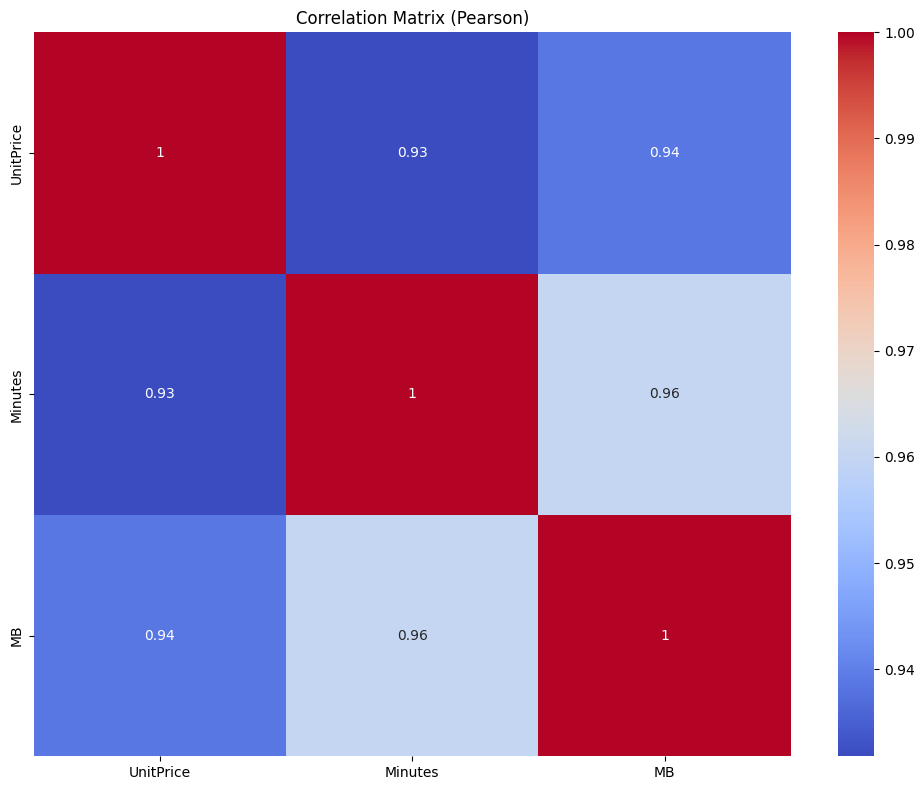

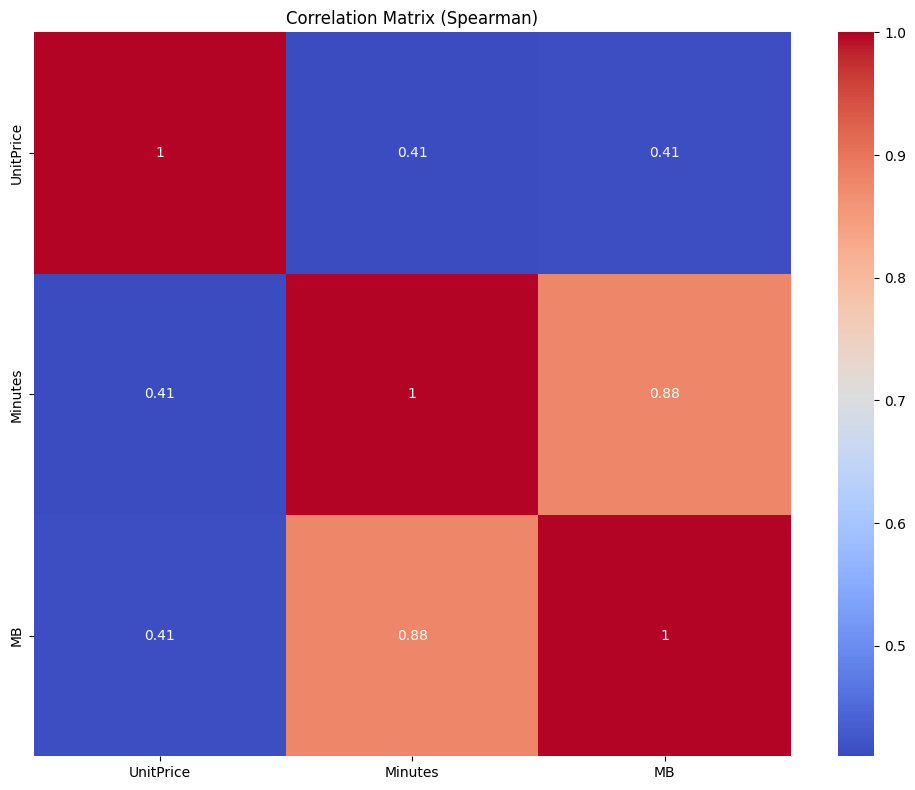

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

file_path = "data/itunes_data.csv"
df = pd.read_csv(file_path)


df['Minutes'] = df['Milliseconds'] / (1000 * 60) 
df['MB'] = df['Bytes'] / 1_000_000  
df.drop(['Milliseconds', 'Bytes'], axis=1, inplace=True)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(y=df['Minutes'], ax=axes[0])
sns.boxplot(y=df['Minutes'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxenplot(y=df['Minutes'], ax=axes[0])
sns.boxenplot(y=df['Minutes'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.histplot(x=df['Minutes'], kde=True)
plt.title("Distribution of Minutes with KDE")
plt.xlabel("Minutes")
plt.ylabel("Frequency")
plt.tight_layout()

top_5_genres = df['Genre'].value_counts().index[:5]
top_5_data = df[df['Genre'].isin(top_5_genres)]
plt.figure(figsize=(8, 6))
sns.violinplot(data=top_5_data, x='Minutes', y='Genre')
plt.title("Violin Plot for Top 5 Genres")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='Minutes', y='MB')
plt.title("Scatter Plot of Minutes vs MB")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.scatterplot(data=top_5_data, x='Minutes', y='MB', hue='Genre')
plt.title("Scatter Plot of Minutes vs MB (Top 5 Genres)")
plt.tight_layout()

sns.pairplot(data=df)
plt.tight_layout()


numeric_df = df.select_dtypes(include='number')
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix (Pearson)")
plt.tight_layout()

plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(method='spearman'), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix (Spearman)")
plt.tight_layout()

threshold = 0.7
correlation_matrix = numeric_df.corr()
high_corr = correlation_matrix[(correlation_matrix >= threshold) & (correlation_matrix < 1.0)].stack()
print("High Correlations (Threshold >= 0.7):\n", high_corr)

plt.show()


### Challenge 2: hous_pricing dataset 

Do the EDA and visualization procedures to explore the data/hous_pricing dataset.

Report the possible high correlation found from your visualization EDA.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4600 non-null   object 
 1   price          4600 non-null   float64
 2   bedrooms       4600 non-null   float64
 3   bathrooms      4600 non-null   float64
 4   sqft_living    4600 non-null   int64  
 5   sqft_lot       4600 non-null   int64  
 6   floors         4600 non-null   float64
 7   waterfront     4600 non-null   int64  
 8   view           4600 non-null   int64  
 9   condition      4600 non-null   int64  
 10  sqft_above     4600 non-null   int64  
 11  sqft_basement  4600 non-null   int64  
 12  yr_built       4600 non-null   int64  
 13  yr_renovated   4600 non-null   int64  
 14  street         4600 non-null   object 
 15  city           4600 non-null   object 
 16  statezip       4600 non-null   object 
 17  country        4600 non-null   object 
dtypes: float

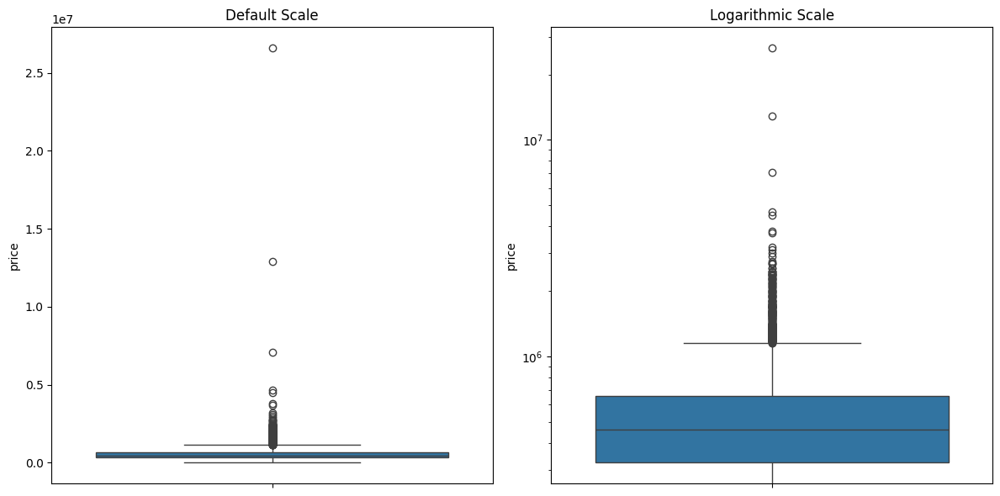

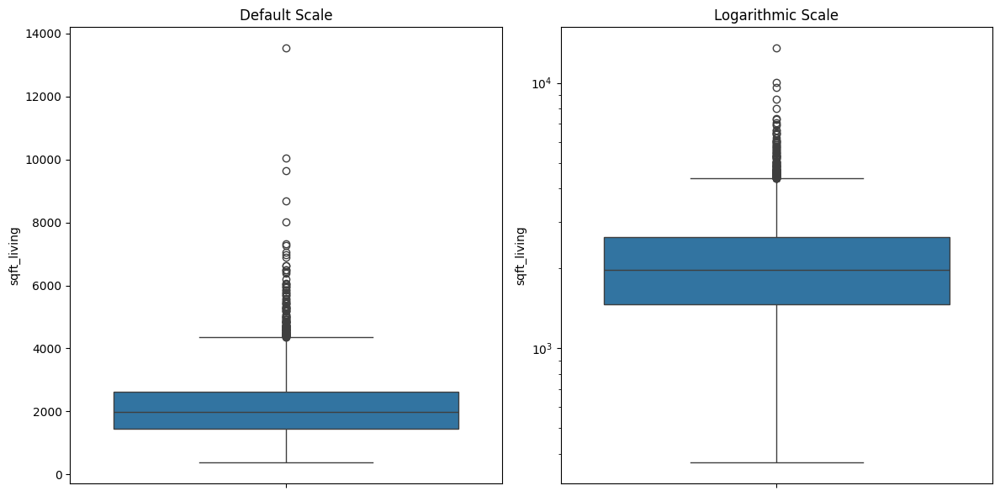

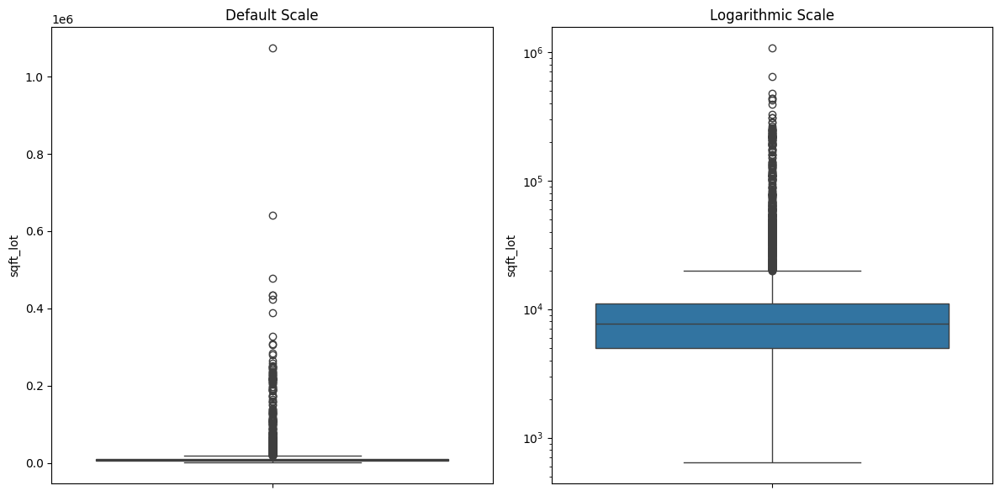

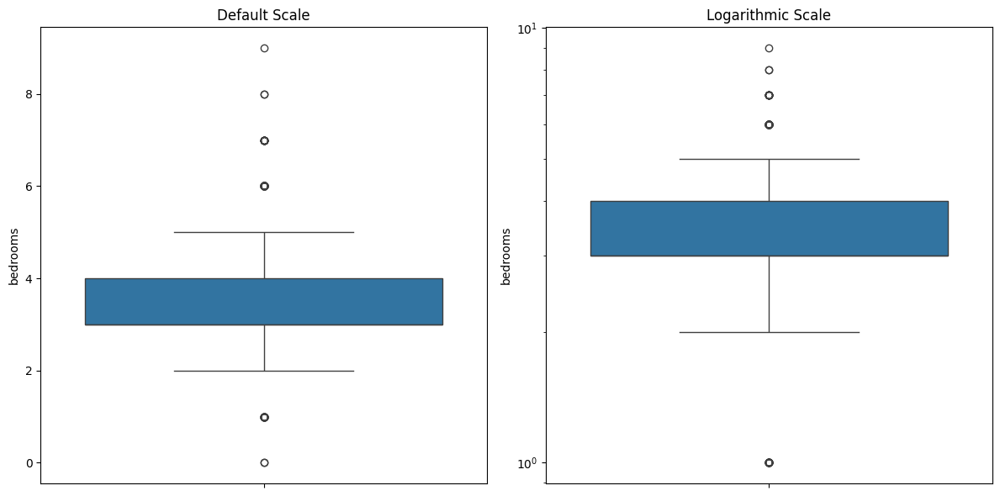

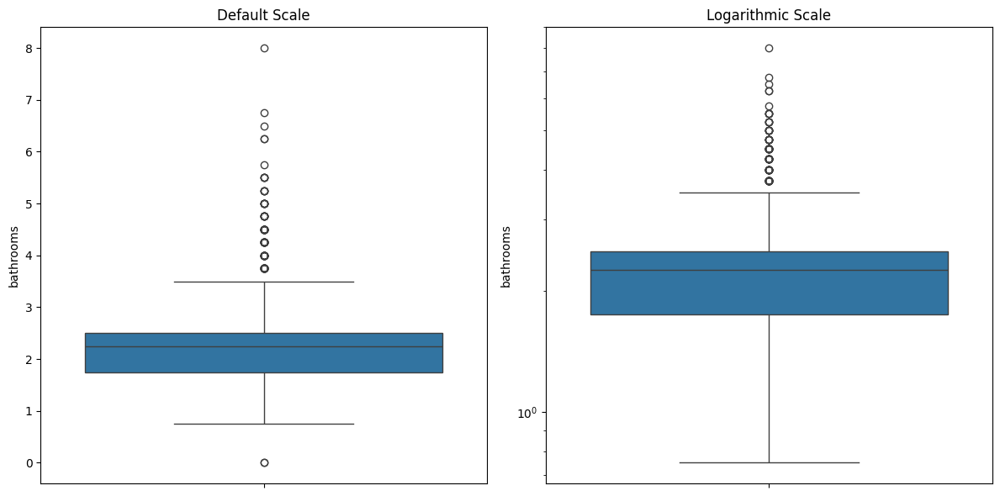

...

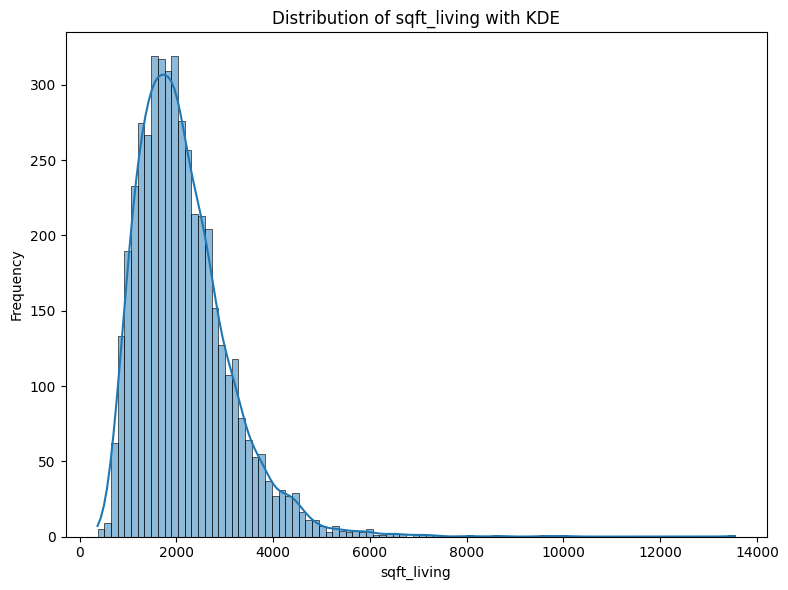

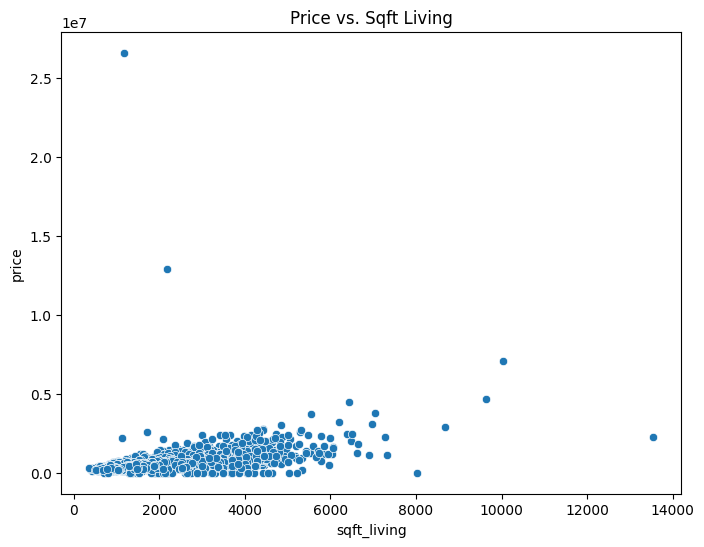

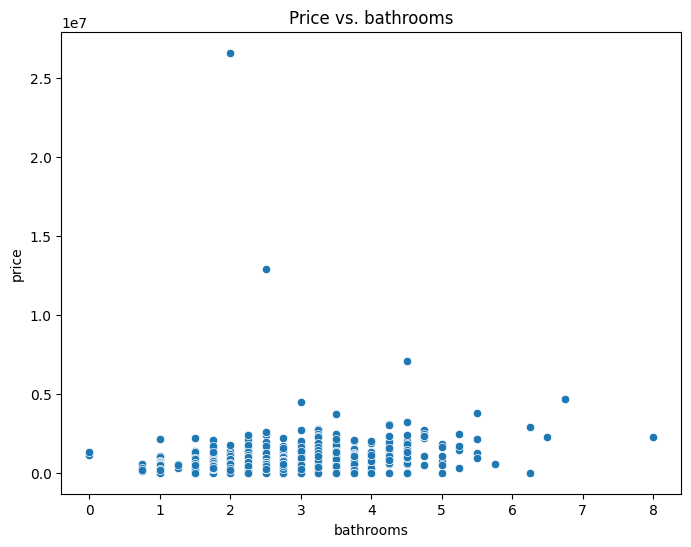

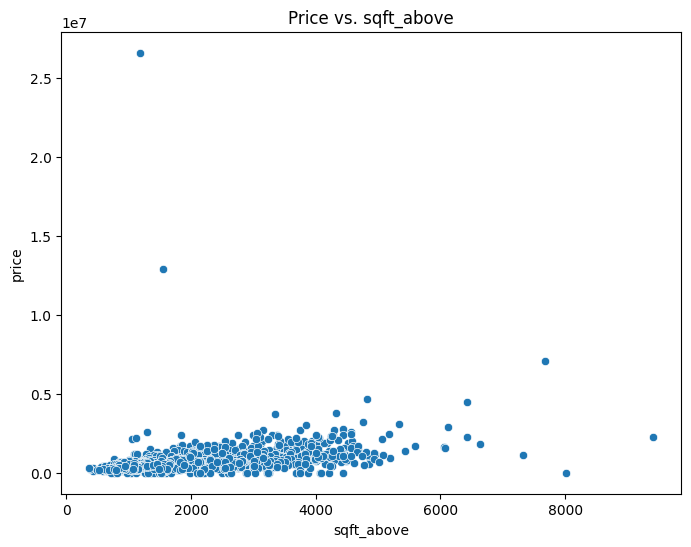

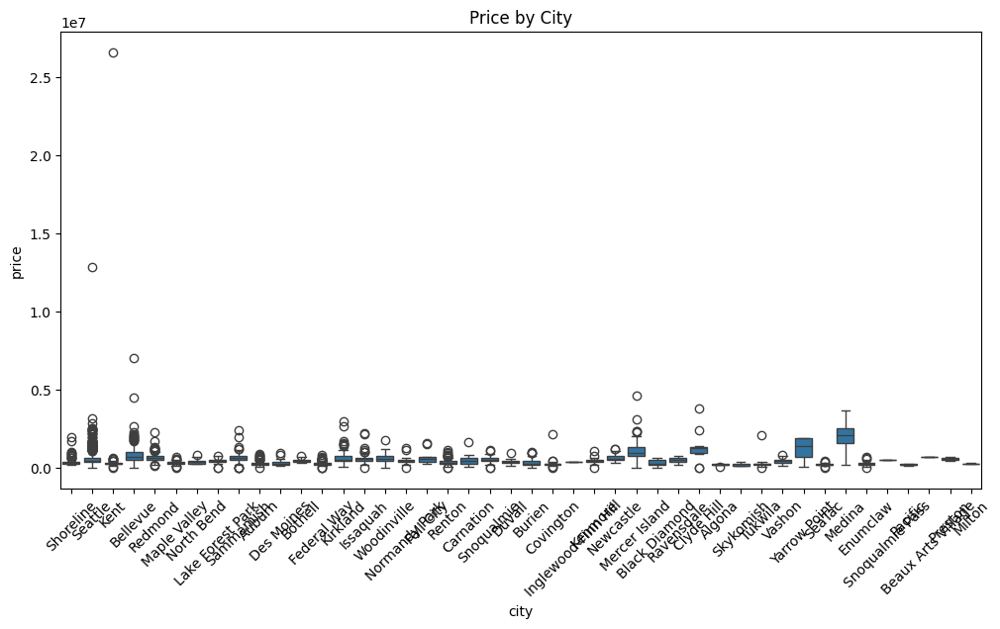

C:\Users\el badr info\AppData\Local\Temp\ipykernel_2288\3747826361.py:103: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='city', data=df, order=df['city'].value_counts().index, palette='viridis')


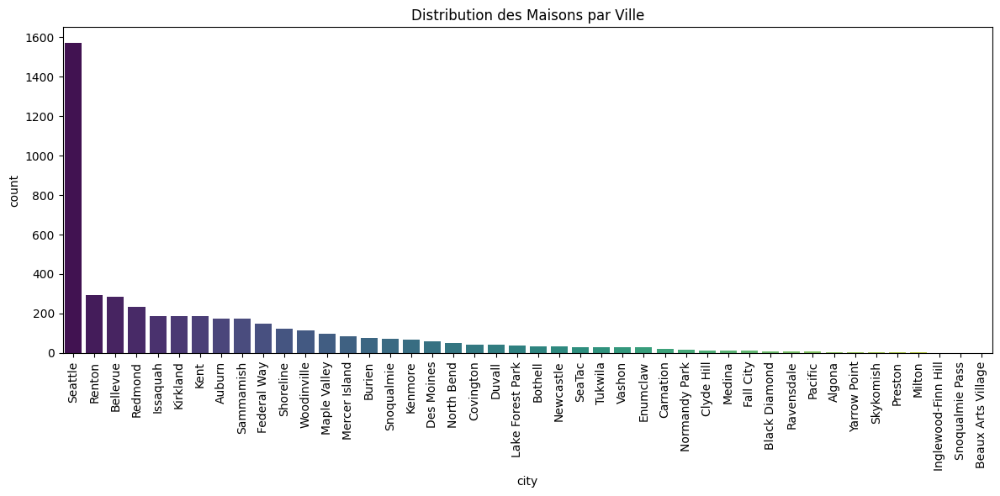

C:\Users\el badr info\AppData\Local\Temp\ipykernel_2288\3747826361.py:111: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y='price', data=df, estimator='mean', palette='coolwarm')


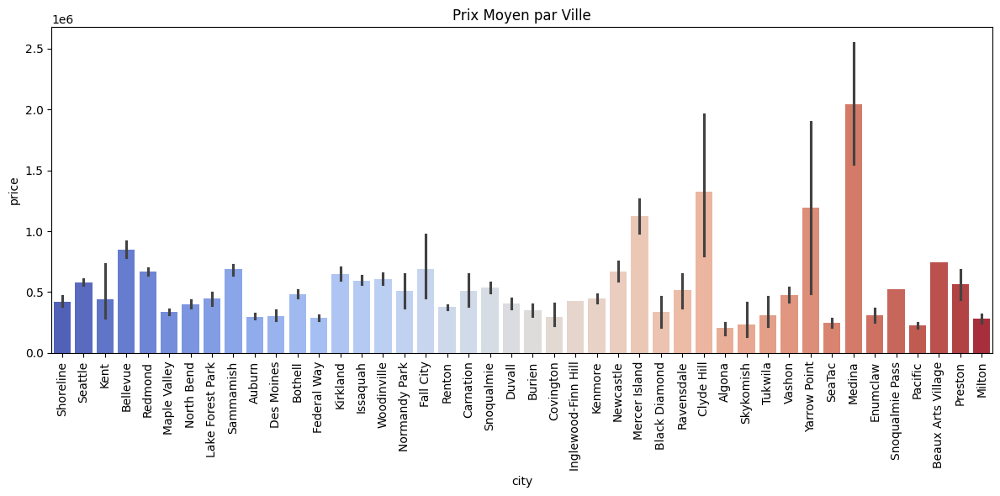

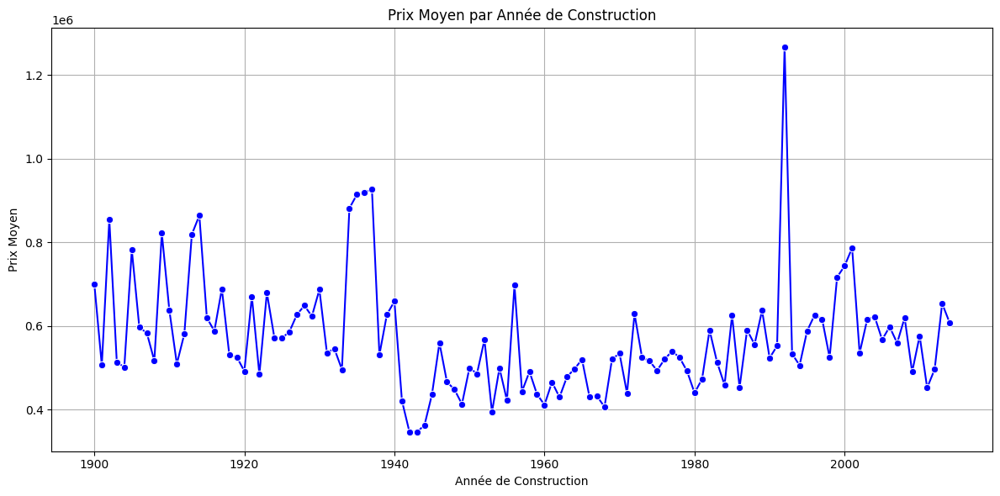

Corrélation avec 'price' (Pearson):
price            1.000000
sqft_living      0.430410
sqft_above       0.367570
bathrooms        0.327110
view             0.228504
sqft_basement    0.210427
bedrooms         0.200336
floors           0.151461
waterfront       0.135648
sqft_lot         0.050451
condition        0.034915
yr_built         0.021857
yr_renovated    -0.028774
Name: price, dtype: float64


C:\Users\el badr info\AppData\Local\Temp\ipykernel_2288\3747826361.py:147: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=price_corr_pearson.index, y=price_corr_pearson.values, palette='coolwarm')


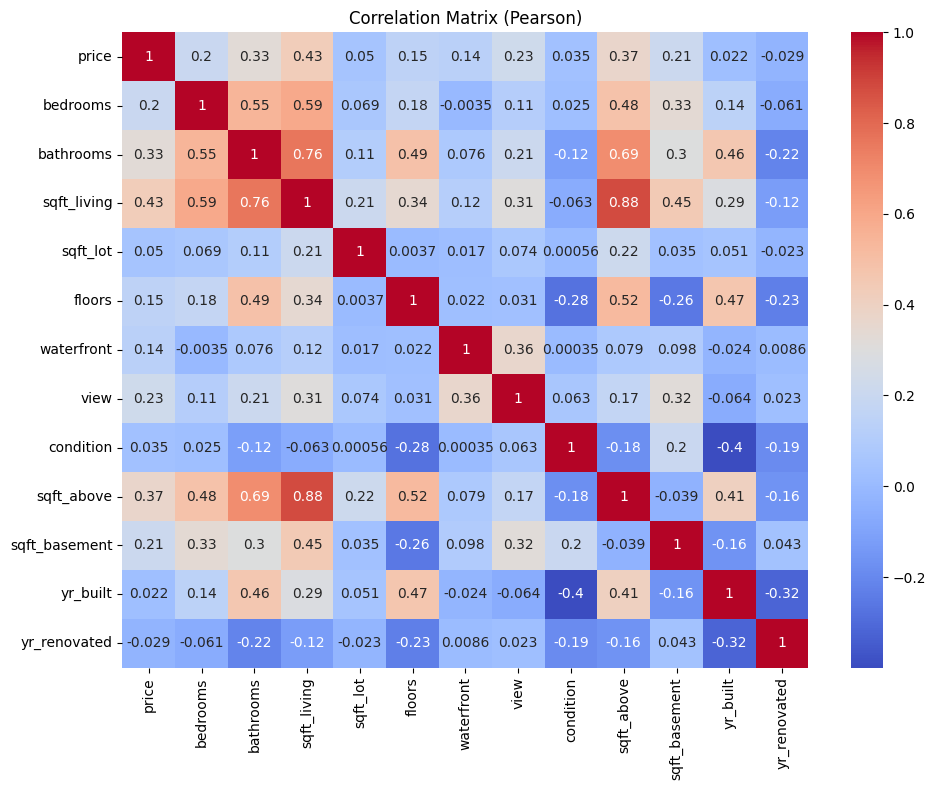

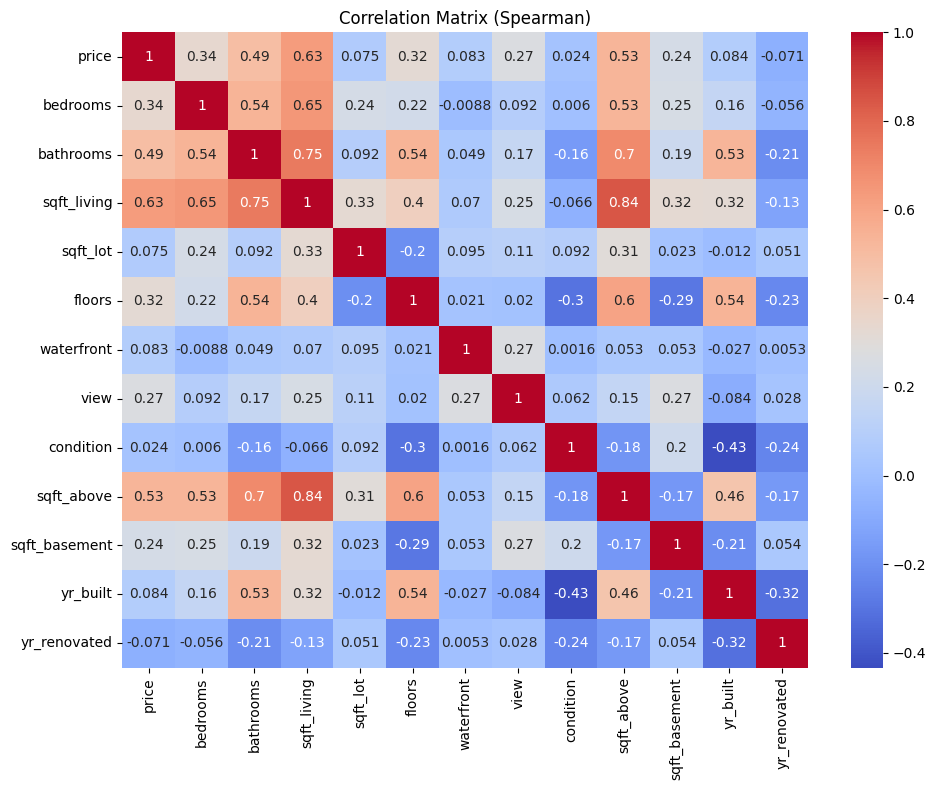

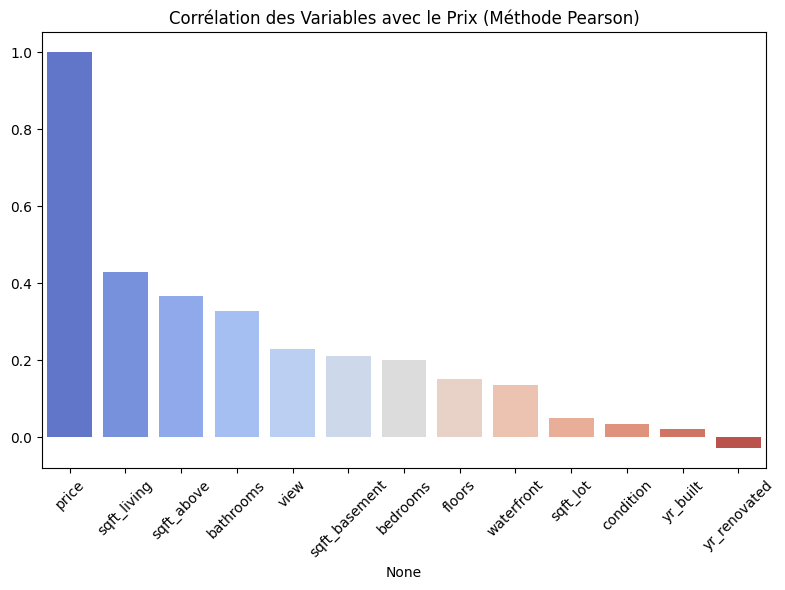

Corrélation avec 'price' (Spearman):
price            1.000000
sqft_living      0.631264
sqft_above       0.534038
bathrooms        0.492451
bedrooms         0.337863
floors           0.320929
view             0.267564
sqft_basement    0.236591
yr_built         0.084415
waterfront       0.083184
sqft_lot         0.075483
condition        0.023843
yr_renovated    -0.070935
Name: price, dtype: float64


C:\Users\el badr info\AppData\Local\Temp\ipykernel_2288\3747826361.py:159: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=price_corr_spearman.index, y=price_corr_spearman.values, palette='coolwarm')


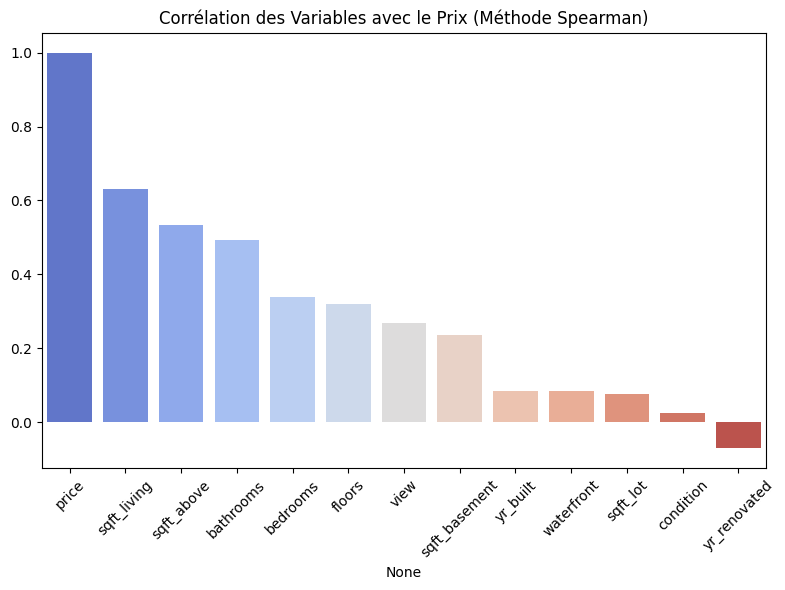

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
from ydata_profiling import ProfileReport
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "data/house_pricing.csv"
df = pd.read_csv(file_path)
print(df.info())
print(df.describe())
print(df.isnull().sum())

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(y=df['price'], ax=axes[0])
sns.boxplot(y=df['price'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(y=df['sqft_living'], ax=axes[0])
sns.boxplot(y=df['sqft_living'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(y=df['sqft_lot'], ax=axes[0])
sns.boxplot(y=df['sqft_lot'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(y=df['bedrooms'], ax=axes[0])
sns.boxplot(y=df['bedrooms'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.boxplot(y=df['bathrooms'], ax=axes[0])
sns.boxplot(y=df['bathrooms'], ax=axes[1])
axes[1].set_yscale('log')  
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.histplot(x=df['price'], kde=True)
plt.title("Distribution of price with KDE")
plt.xlabel("price")
plt.ylabel("Frequency")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.histplot(x=df['bedrooms'], kde=True)
plt.title("Distribution of bedrooms with KDE")
plt.xlabel("bedrooms")
plt.ylabel("Frequency")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.histplot(x=df['bathrooms'], kde=True)
plt.title("Distribution of bathrooms with KDE")
plt.xlabel("bathrooms")
plt.ylabel("Frequency")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.histplot(x=df['sqft_living'], kde=True)
plt.title("Distribution of sqft_living with KDE")
plt.xlabel("sqft_living")
plt.ylabel("Frequency")
plt.tight_layout()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='sqft_living', y='price', data=df)
plt.title('Price vs. Sqft Living')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='bathrooms', y='price', data=df)
plt.title('Price vs. bathrooms')
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='sqft_above', y='price', data=df)
plt.title('Price vs. sqft_above')
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(x='city', y='price', data=df)
plt.xticks(rotation=45)
plt.title('Price by City')
plt.show()


plt.figure(figsize=(12, 6))
sns.countplot(x='city', data=df, order=df['city'].value_counts().index, palette='viridis')
plt.title('Distribution des Maisons par Ville')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 6))
sns.barplot(x='city', y='price', data=df, estimator='mean', palette='coolwarm')
plt.title('Prix Moyen par Ville')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()



avg_price_per_year = df.groupby('yr_built')['price'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x='yr_built', y='price', data=avg_price_per_year, marker='o', color='b')
plt.title('Prix Moyen par Année de Construction')
plt.xlabel('Année de Construction')
plt.ylabel('Prix Moyen')
plt.grid(True)
plt.tight_layout()
plt.show()

numeric_df = df.select_dtypes(include='number')
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix (Pearson)")
plt.tight_layout()

plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(method='spearman'), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix (Spearman)")
plt.tight_layout()

price_corr_pearson = numeric_df.corr()['price'].sort_values(ascending=False)

print("Corrélation avec 'price' (Pearson):")
print(price_corr_pearson)

plt.figure(figsize=(8, 6))
sns.barplot(x=price_corr_pearson.index, y=price_corr_pearson.values, palette='coolwarm')
plt.title('Corrélation des Variables avec le Prix (Méthode Pearson)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

price_corr_spearman = numeric_df.corr(method='spearman')['price'].sort_values(ascending=False)

print("Corrélation avec 'price' (Spearman):")
print(price_corr_spearman)

plt.figure(figsize=(8, 6))
sns.barplot(x=price_corr_spearman.index, y=price_corr_spearman.values, palette='coolwarm')
plt.title('Corrélation des Variables avec le Prix (Méthode Spearman)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


report = ProfileReport(df)

report.to_notebook_iframe()

report.to_file("house_pricing_report.html")

# numeric_df = df.select_dtypes(include='number')
# correlation_matrix = numeric_df.corr()
# plt.figure(figsize=(8, 6))
# sns.heatmap(correlation_matrix, annot=True)
# plt.figure(figsize=(8, 6))
# sns.heatmap(numeric_df.corr(method='spearman'), annot=True) 